## Simple simulation

sim params

In [88]:
mass_ratio = 3

Global Params for animation

In [89]:
duration = 15.0  # secs
max_visual_hz = 70 # Hz - lower scales slower
base_size = 7e3 # for scatter markers

simulate (cribbed from [this example](https://labcit.ligo.caltech.edu/~ajw/ph4/InspiralExercise_IPythonNotebook.pdf))...

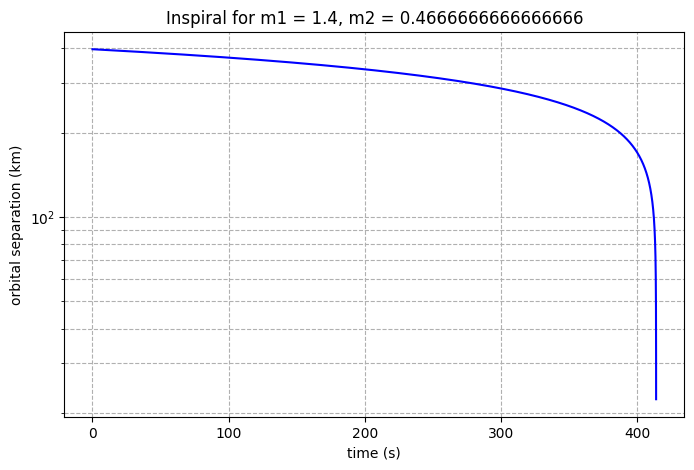

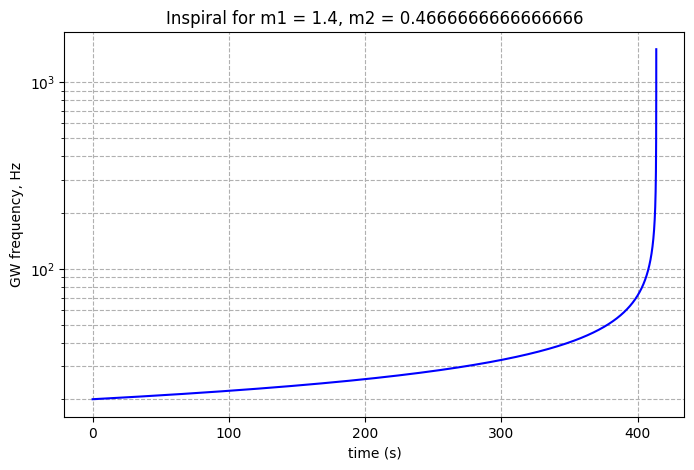

In [90]:
import numpy as np
import matplotlib.pyplot as plt

# --- Constants in SI units ---
pi = np.pi
c = 299792458.0          # Speed of light (m/s)
Msun = 1.98892e30        # Solar mass (kg)
G = 6.67384e-11          # Gravitational constant (m^3 / (s^2 * kg))

# --- Sampling parameters ---
fsamp = 100           # Sampling rate (Hz)
dt = 1.0 / fsamp         # Time step (s)

# --- Binary parameters (Solar masses) ---
m1 = 1.4
m2 = m1/mass_ratio
M1 = m1 * Msun
M2 = m2 * Msun
M = M1 + M2              # Total mass
Mu = (M1 * M2) / M       # Reduced mass

# --- Initial conditions ---
Porb0 = 0.1              # Initial orbital period (s)
forb0 = 1.0 / Porb0
fGW0 = 2.0 * forb0       # Initial GW frequency
om0 = 2.0 * pi * forb0
aorb0 = (G * M / om0**2)**(1.0/3.0) # Kepler's 3rd law for initial separation

# --- Final conditions at ISCO ---
aorbI = 6.0 * G * M / c**2

# --- Numerical Evolution ---
aorb = [aorb0] # List to track orbital separation

# Loop until orbital separation reaches ISCO
while aorb[-1] > aorbI:
    # Virial theorem for total energy
    Etot = -G * Mu * M / (2.0 * aorb[-1])

    # Energy loss due to GWs (quadrupole approximation)
    Edot = -(32.0 / 5.0) * (G**4 / c**5) * (Mu**2 * M**3) / (aorb[-1]**5)

    # Update total energy for the next time step
    Etot = Etot + Edot * dt

    # Calculate new orbital separation based on the updated energy
    aorbs = -G * Mu * M / (2.0 * Etot)

    # Break the loop if the system inspirals past ISCO
    if aorbs < aorbI:
        break

    aorb.append(aorbs)

# --- Post-Processing ---
aorb = np.array(aorb)
t = np.arange(len(aorb)) * dt

# Compute GW frequency over time from Kepler's 3rd law
om = np.sqrt(G * M / aorb**3)
forb = om / (2.0 * pi)
fGW = 2.0 * forb

# --- Plotting ---
stitl = f"Inspiral for m1 = {m1}, m2 = {m2}"

# 1. Orbital Separation vs Time
plt.figure(figsize=(8, 5))
plt.semilogy(t, aorb / 1e3, color='blue') # Converted to km for plotting
plt.xlabel('time (s)')
plt.ylabel('orbital separation (km)')
plt.title(stitl)
plt.grid(True, which="both", ls="--")
plt.show()

# 2. GW Frequency vs Time
plt.figure(figsize=(8, 5))
plt.semilogy(t, fGW, color='blue')
plt.xlabel('time (s)')
plt.ylabel('GW frequency, Hz')
plt.title(stitl)
plt.grid(True, which="both", ls="--")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# --- 1. Animation Settings ---
fps = 30
duration = 20.0
num_frames = int(fps * duration)

# --- 2. Downsample the Data ---
# Grab evenly spaced indices across the original arrays
indices = np.linspace(0, len(aorb) - 1, num_frames, dtype=int)
aorb_anim = aorb[indices]
forb_anim = forb[indices] # Using orbital freq (fGW / 2)

# --- 3. Scale for Visual Smoothness (Prevent Aliasing) ---
# Cap the maximum visual rotation at 5 Hz so it looks smooth at 30 fps.
freq_scale = max_visual_hz / np.max(forb_anim)
forb_vis = forb_anim * freq_scale

# Re-integrate the scaled frequency to get a smooth visual phase
dt_anim = duration / num_frames
phase_vis = 2.0 * np.pi * np.cumsum(forb_vis) * dt_anim

# Normalize spatial separation (initial separation = 1.0)
aorb_vis = aorb_anim / aorb_anim[0]


# --- 4. Matplotlib Setup ---
fig, ax = plt.subplots(figsize=(6, 6))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

# # Create the two white circle markers ('wo')
# markers, = ax.plot([0,0], [0,0], 'wo', markersize=[80, 80/mass_ratio])
# Initialize empty scatter plot (c sets the color array)
scat = ax.scatter([0,0], [0,0], c=['white', 'white'],
                  sizes=[base_size, base_size*pow(mass_ratio,-2/3)])

# Set static axes limits based on the normalized initial separation
max_radius = 1.0 / 1.0
padding = 0.1
ax.set_xlim(-(max_radius + padding), max_radius + padding)
ax.set_ylim(-(max_radius + padding), max_radius + padding)
ax.set_aspect('equal') # Keep the orbits perfectly circular
ax.axis('off')         # Hide axes for a clean void look

# --- 5. Animation Loop ---
def update(frame):
    a = aorb_vis[frame]
    phi = phase_vis[frame]

    x = [a/2.0 * np.cos(phi), -a/2.0 * np.cos(phi)]
    y = [a/2.0 * np.sin(phi), -a/2.0 * np.sin(phi)]

    # Scatter requires an (N, 2) array of coordinates, so we stack them
    coords = np.column_stack((x, y))

    # Update positions and sizes
    scat.set_offsets(coords)

    return scat,

# Create the animation
ani = animation.FuncAnimation(
    fig, update, frames=num_frames,
    interval=1000/fps, blit=True
)

# --- 6. Display ---
# If you are running this inside a Jupyter/IPython Notebook, uncomment the lines below
# to embed the animation directly in the cell as an HTML5 video:
#
from IPython.display import HTML, Video
display(HTML(ani.to_html5_video()))
plt.close() # Prevents a duplicate static plot from rendering

writer = animation.FFMpegWriter(
    fps=fps,
    metadata=dict(artist='Mock Binary System'),
    bitrate=1800
)

print("Rendering video...")
ani.save('silent_inspiral.mp4', writer=writer)
print("Silent video saved as 'silent_inspiral.mp4'")


# converts the phase into multiples (0.x, 1.x, 2.x, 3.x...)
pi_multiples = np.floor(phase_vis / np.pi)

# Find the indices where this value jumps to the next integer.
pi_crossing_indices = np.where(np.diff(pi_multiples) > 0)[0] + 1

# Convert those specific indices into actual timestamps (in seconds)
pi_crossing_times = pi_crossing_indices * dt_anim

## Waveform-like with a bit of ringdown

Mapping a sine to frequency.

In [103]:
extfac = 1.05

# --- 1. Find the exact times of the visual rotations ---
# Using phase_vis, dt_anim, and num_frames from the previous animation script
cycles = np.floor(phase_vis / (2 * np.pi))

# Find the indices where the cycle count increases
trigger_indices = np.where(np.diff(cycles) > 0)[0]

# Convert those indices into exact timestamps (in seconds)
trigger_times = trigger_indices * dt_anim

norm_times = pi_crossing_times/(duration*extfac)

base_note = 'F2'
semitone_range = [0, 24]
ring_frac = 0.001

Generate fake ringdown properties

In [104]:
# add a bit of fake ringdown to this
Next = t.size // int(1/ring_frac)
t_ext = np.concatenate([t,
    np.linspace(t[-1]+np.diff(t)[0], t[-1]+Next*np.diff(t)[0],
              Next-1)])
log2_forb = np.log2(forb)
log2_forb_ext = np.concatenate([log2_forb,[log2_forb[-1]]*(Next-1)])
h_ext = np.concatenate([1./aorb, np.linspace(1/aorb[0], 0, Next-1)])

41368
41408 41408 41408


and sonify...

In [105]:
import numpy as np
from strauss.sonification import Sonification
from strauss.sources import Objects
from strauss.score import Score
from strauss.generator import Synthesizer

# Setup the Strauss Synthesizer
generator = Synthesizer()
generator.load_preset('pitch_mapper')

# Modify the loaded preset to use a pure sine wave oscillator
generator.modify_preset(
    {'oscillators': {
        'osc1': {
            'form': 'sine',
            'level': 1.,
            'detune': 0.,
            'phase': 0
            }
        },
     }
    )

# Define the Musical Score
# We use 2 notes, and set the playback length.
notes = [['F2', 'C3']]
score = Score(notes, duration*(1+ring_frac))

# Map the Data to Sound Parameters
# The Objects source class handles continuous time-series evolution.
# The arrays are wrapped in lists because we are sonifying exactly one "object" (the binary system).
data = {
    'pitch': [0,1],                # Base pitch multiplier
    'time_evo': [t_ext]*2,             # Time axis mapped across the audio length
    'pitch_shift': [log2_forb_ext]*2,  # Pitch shifts according to log2(orbital frequency)
    'volume': [h_ext]*2,             # Volume follows the orbital separation
}

# Define Mapping Limits
# We map the data's percentiles to the synthesizer's parameter bounds.
lims = {
    'time_evo': ('0%', '100%'),
    'pitch_shift': ('0%', '100%'),
    'volume': ('0%', '100%')
}

plims = {
    'pitch_shift': semitone_range,
    'volume': (0.6, 1),
}

# Initialize Sources and Apply Mapping
sources = Objects(data.keys())
sources.fromdict(data)
sources.apply_mapping_functions(map_lims=lims, param_lims=plims)

# Render the Sonification
system = "mono"
soni = Sonification(score, sources, generator, system)
soni.render()
soni.notebook_display(show_waveform=False)
# Output the audio
soni.save('5th_chirp.wav')


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 16.20it/s]


Saved 5th_chirp.wav


<Figure size 1800x1200 with 0 Axes>

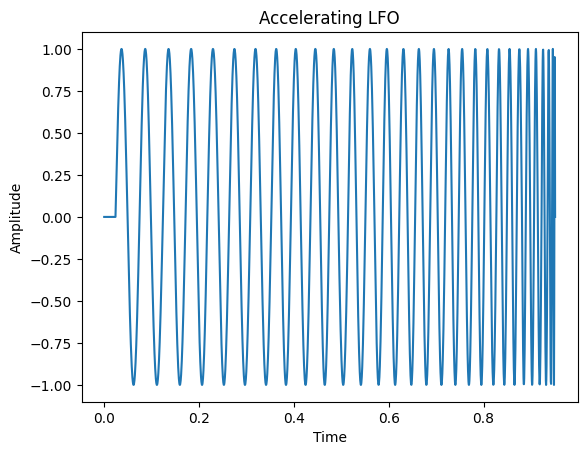

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.78it/s]


Saved windy_LFO_orbits_low.wav


<Figure size 1800x1200 with 0 Axes>

In [107]:
# Extra LFO layer

import numpy as np
from strauss.sonification import Sonification
from strauss.sources import Objects
from strauss.score import Score
from strauss.generator import Synthesizer

# Create cutoff LFO data
t = np.linspace(0, norm_times[-1], 2000)  # high resolution time array
orbit_index = np.arange(len(norm_times))

# interpolate fractional orbit count
orbit_progress = np.interp(t, norm_times, orbit_index)

phase = 1 * np.pi * orbit_progress # Add pi to this to offset one of the BH orbits
lfo = np.sin(phase)

# plot it
plt.plot(t, lfo)
plt.title("Accelerating LFO")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.show()

generator = Synthesizer()
generator.load_preset('windy')

generator.modify_preset({'filter': 'on'})

notes = [['F2']]
score = Score(notes, duration*(1+ring_frac))

cutoff = (lfo + 1) / 2  # 0 → 1

data = {
    'pitch': [0],             
    'time_evo': [t],             
    'cutoff': [lfo],
    # 'azimuth': [lfo],
    # 'polar': [0.5]
}

lims = {
    'time_evo': ('0%', '100%')
}

# 0.1 - 0.4 for the larger BH, 0.3 - 0.6 for the less massive
plims = {
    'cutoff': (0.1, 0.4),
}

sources = Objects(data.keys())
sources.fromdict(data)
sources.apply_mapping_functions(map_lims=lims, param_lims=plims)

system = "stereo"
soni = Sonification(score, sources, generator, system)
soni.render()
soni.notebook_display(show_waveform=False)
soni.save('windy_LFO_orbits_low.wav')
